In [36]:
#Import Libraries
import os
import glob 

#Library for geo-spatial images and objects
import rasterio as rio
from rasterio.plot import show
from rasterio.mask import mask
from shapely.geometry import Point, LineString, Polygon, MultiPolygon
from shapely.geometry import box as bbox
import geopandas as gpd

#Library for population calculations
import rasterstats

#Support libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from skimage.transform import rescale, resize
from PIL import Image

In [41]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [42]:
def show_raster(df, raster):
    fig, ax = plt.subplots(figsize=(20,20))
    show(raster, ax=ax)
    df.plot(ax=ax, facecolor='none', edgecolor='r')

def print_imgarea(rastername, numdiv):
    num_divs = [numdiv[0], numdiv[1]]
    with rio.open(rastername) as raster:
        print('Image width: {}  Image height: {}'.format(int(raster.width/numdiv[0]), int(raster.height/numdiv[1])))

def pop_value(geom):
    single_pop = rasterstats.zonal_stats(geom, 'D:\EarthProImages\Pop.tif', stats=['sum'])[0]['sum']
    return single_pop

def overlay_raster(gdf, rastername):
    style = dict(size=13, color='white',fontweight='bold')
    rast = rio.open(rastername)
    fig, ax = plt.subplots(figsize=(20,20))
    show(rast, ax=ax)
    gdf.plot(ax=ax, facecolor='none', edgecolor='r')
    for i in range(len(gdf)):
        plt.text(gdf.iloc[i].Centroid.x, gdf.iloc[i].Centroid.y, str(gdf.iloc[i].target), **style)
    rast.close()

def extract_examples(rastername, numdiv, output_path, poplim, h, w, extract='False'):
    with rio.open(rastername) as raster:
        num_divs = [numdiv[0], numdiv[1]]
        print('Image width: {}  Image height: {}'.format(int(raster.width/numdiv[0]), int(raster.height/numdiv[1])))
        #Calculating coordinates needed for binding boxes to geotiffs
        x0, x1 = (raster.bounds[0] + 0.000025, raster.bounds[2] + 0.000025)
        y0, y1 = (raster.bounds[1] + 0.000025, raster.bounds[3] + 0.000025)
        x_multiple = (x1-x0)/num_divs[0]
        y_multiple = (y1-y0)/num_divs[1]
        
        #Creating sequences of boxes
        box_list=[]
        for i in range(num_divs[0]):
            for j in range(num_divs[1]):
                box_geom = bbox(x0+x_multiple*i, y0+y_multiple*j, x0+x_multiple*(i+1), y0+y_multiple*(j+1))
                centroid = box_geom.centroid
                target = pop_value(box_geom)
                if target != None and target>poplim:
                    target = int(target)
                    filename = rastername.split('.')[0] + '#' +str(target) + '.tif'
                    box_list.append([target, filename, box_geom, centroid]) 
        #Make dataframe for training the models by filename and imageset   
        gdf = pd.DataFrame(box_list,  columns = ['target', 'filename', 'Geometry', 'Centroid'])
        gdf = gpd.GeoDataFrame(gdf, geometry='Geometry')
        overlay_raster(gdf, rastername)
        if extract:
            for box in box_list:
                out_image, out_transform = mask(raster, [box[2]], crop=True)
                out_image = np.rollaxis(out_image, 0, 3)
                out_image = resize(out_image, (h, w), anti_aliasing=True)
                out_image = Image.fromarray((out_image * 255).astype(np.uint8))
                out_image.save(output_path+'/'+box[1])  
    return gdf

In [16]:
os.chdir('D:\EarthProImages\HResGeoComp')
img_list = glob.glob('*.tif')

Image width: 400  Image height: 481
Image width: 406  Image height: 452
Image width: 404  Image height: 463
Image width: 406  Image height: 450
Image width: 407  Image height: 448
Image width: 405  Image height: 455
Image width: 409  Image height: 438
Image width: 405  Image height: 456
Image width: 412  Image height: 418
Image width: 404  Image height: 461


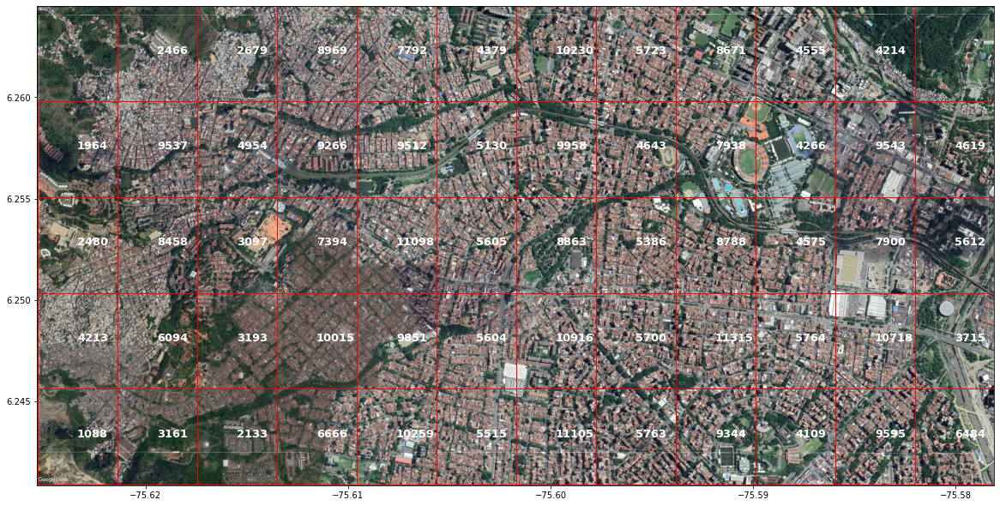

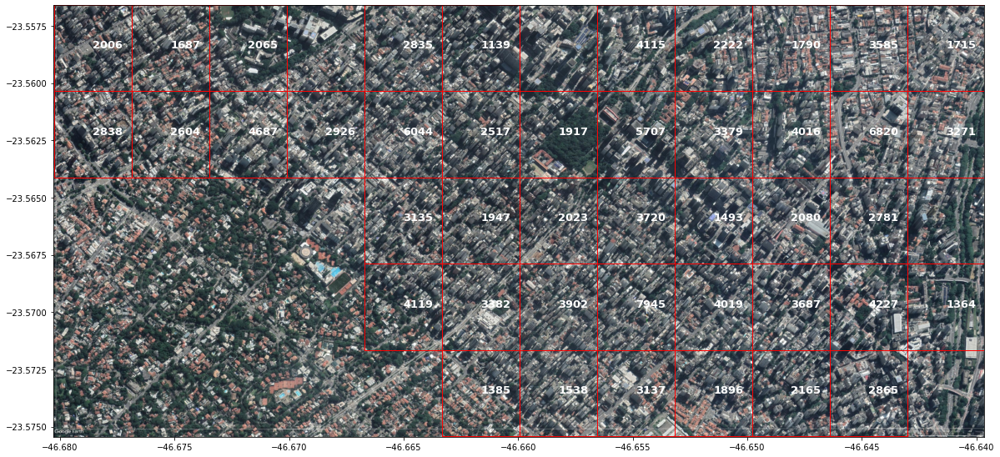

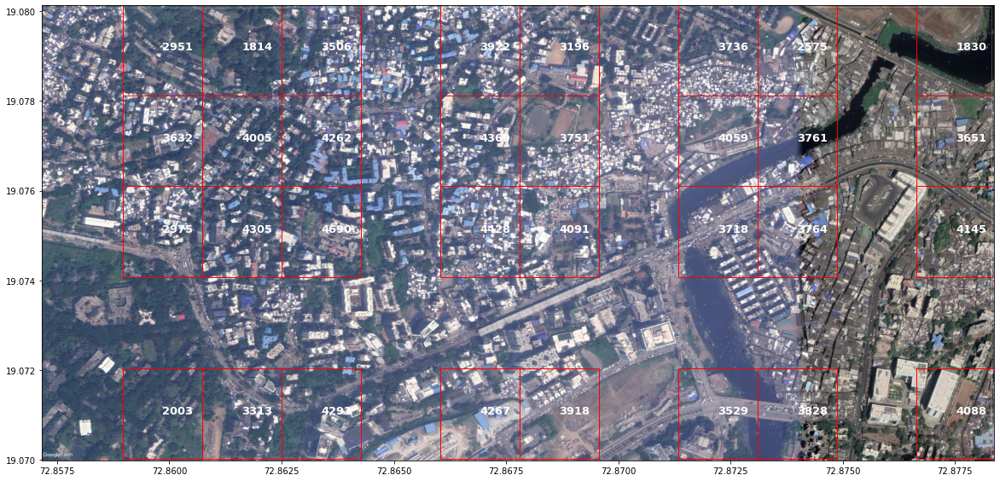

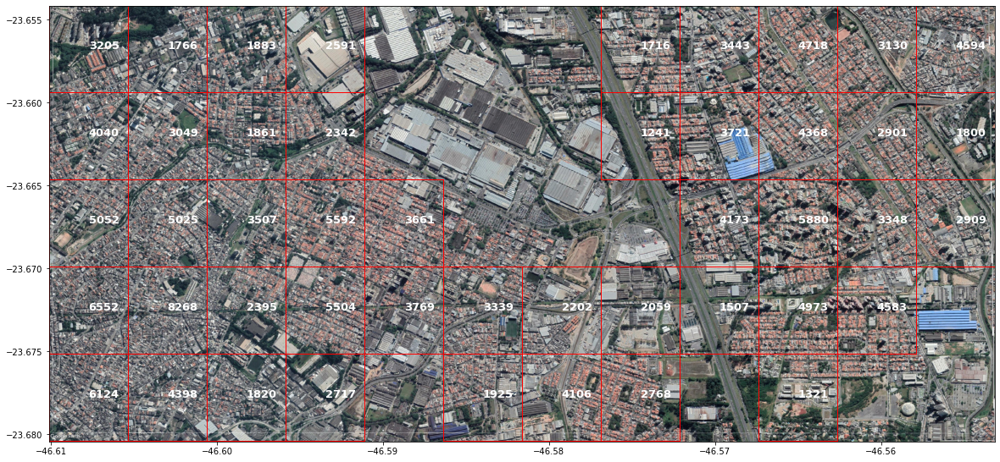

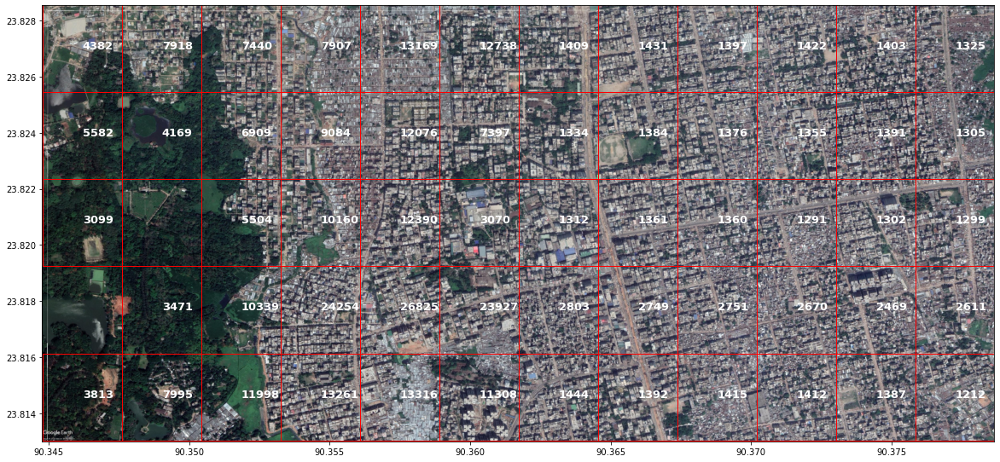

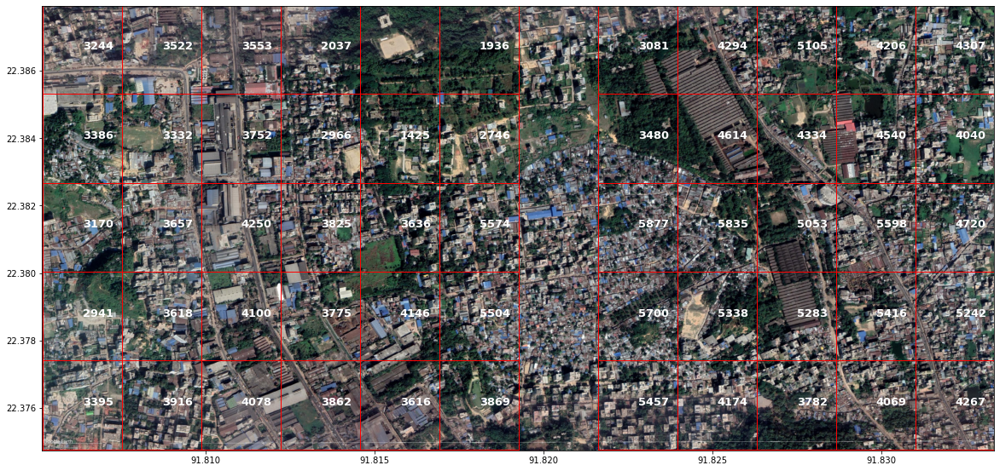

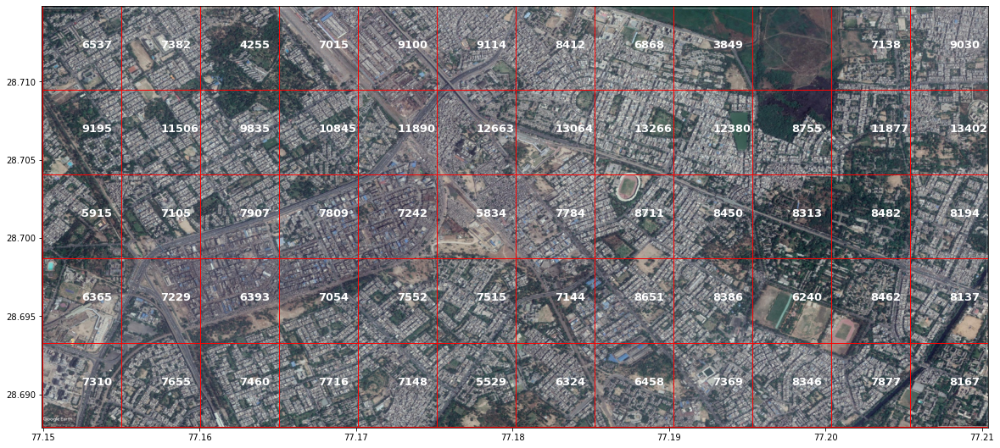

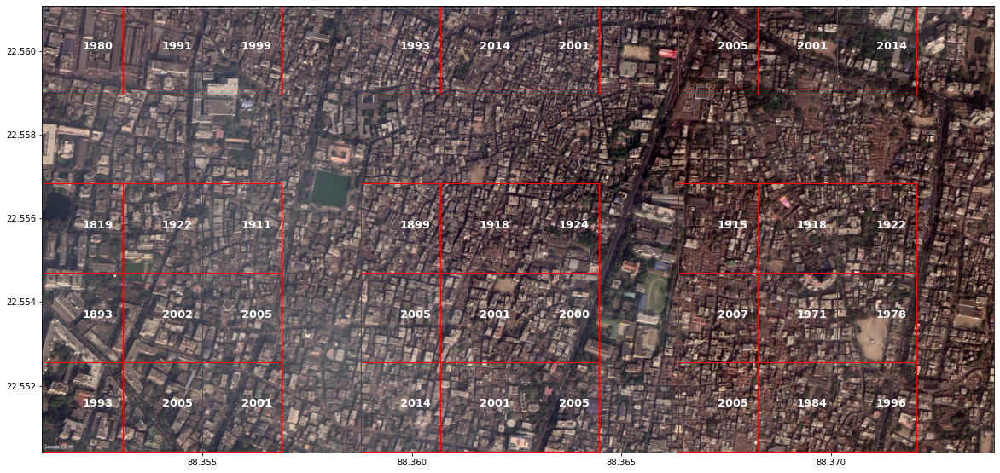

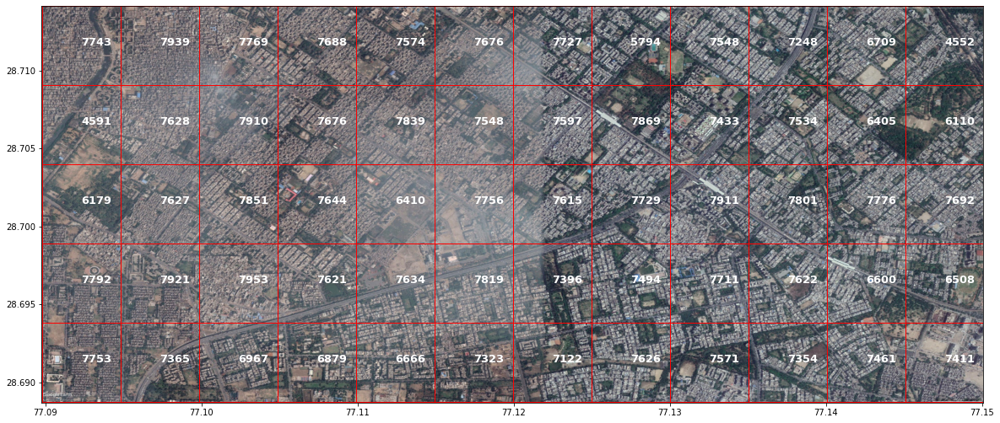

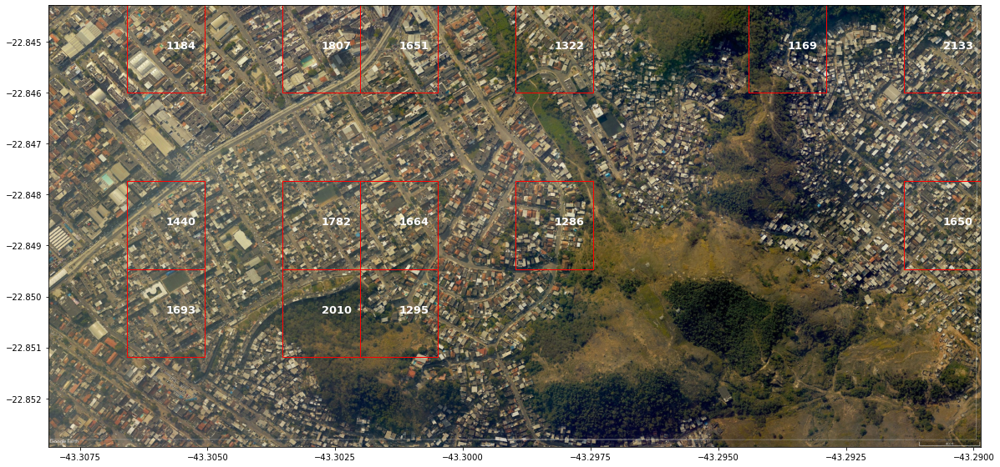

In [40]:
for i in range(10):
    #Select random image
    raster = img_list[np.random.randint(0,len(img_list))]
    #Output to display
    gdf = extract_examples(rastername=raster, numdiv=[12,5],output_path='',poplim=1000, h=300,w=300, extract=False)

